In [1]:
%%bash
echo "Current Conda environment: ${CONDA_DEFAULT_ENV}"
echo "kernel: scRNA2026"

Current Conda environment: base
kernel: scRNA2026


In [2]:
%%bash 
ls

cache
config.ini
DEG.ipynb
DEG-MAST_20200221a.html
DEG-MAST_20200221.html
DEG-MAST.ipynb
DEG-MAST.py
git
GSE130888_RAW
GSE130888_total
Manuscript_sybille_correctedSV.odt
Method_preprocessing_celltyp_identification.odt
NINJ1_20251128.html
NINJ1_20251208.html
NINJ1_20251210.html
NINJ1_20251216.html
NINJ1.ipynb
scanpy_CelltypIdentification_healthy_2_20200221.html
scanpy_CelltypIdentification_healthy_2.ipynb
scanpy_CelltypIdentification_longPD_2_20200221.html
scanpy_CelltypIdentification_longPD_2-Copy1.ipynb
scanpy_CelltypIdentification_longPD_2-Copy1-requirements.txt
scanpy_CelltypIdentification_longPD_2.ipynb
scanpy_CelltypIdentification_longPD_2_newPCASubCLustering.ipynb
scanpy_CelltypIdentification_shortPD_2_20200221.html
scanpy_CelltypIdentification_shortPD_2-Copy1.ipynb
scanpy_CelltypIdentification_shortPD_2-Copy2.ipynb
scanpy_CelltypIdentification_shortPD_2-Copy2-requirements.txt
scanpy_CelltypIdentification_shortPD_2.ipynb
scanpy_CelltypIdentification_shortPD_2_woComBat.ipynb
scanv

In [4]:
#Read config file
import configparser as config
import os
config = config.ConfigParser()
config.read('./config.ini')
data_path=config['PATHS']["wd"]
os.chdir(data_path)

In [5]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

import scanpy as sc

In [6]:
genes = ["NINJ1","CASP1", "CASP3", "CASP8", 'PADI2', 'PADI1', 'PADI4', "IL1B", "IL18", "ZBP1", "CCL2", "TNF", "IL6"] 
#[g for g in adata.var.index if g. startswith("TNF")]

# Healthy

In [7]:
adata_h = sc.read(data_path+'/GSE130888_RAW/H/results_2.h5ad')
adata_h = adata_h[~adata_h.obs["new_clusters"].str.startswith("U")]
adata_h

View of AnnData object with n_obs × n_vars = 15757 × 21772
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub', 'louvain_Meso_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'louvain', 'louvain_Meso_sub_colors', 'louvain_T_sub_colors', 'louvain_colors', 'neighbors', 'new_clusters_colors', 'pca', 'rank_genes_Meso_sub', 'rank_genes_T_sub', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

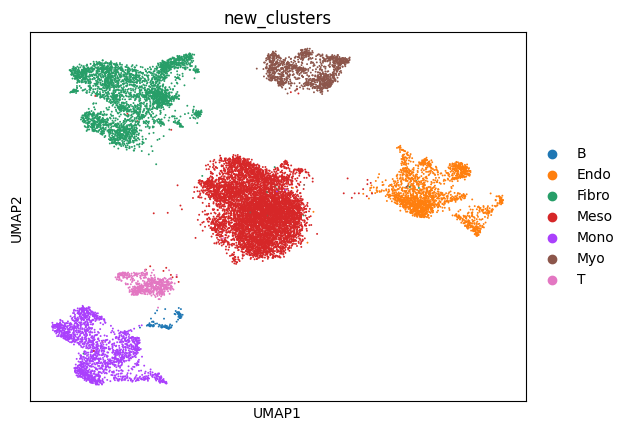

In [8]:
sc.pl.umap(adata_h, color="new_clusters", ncols=2, vmin="p1.5", vmax="p98.5")

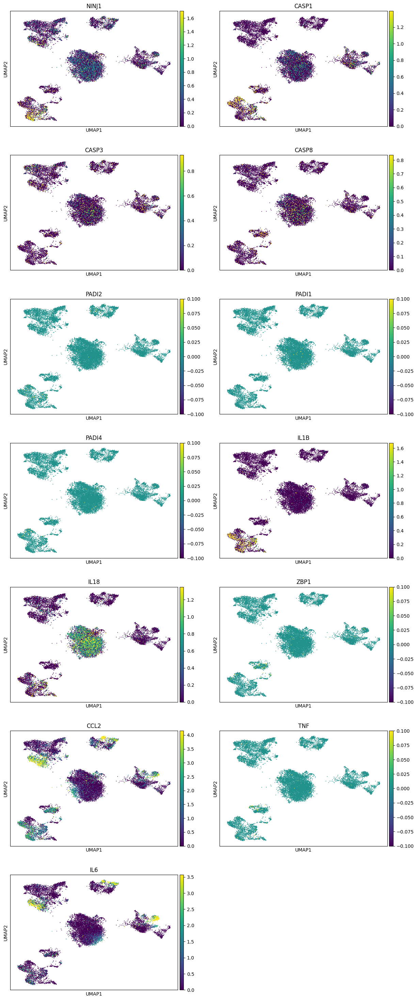

In [9]:
sc.pl.umap(adata_h, color=genes, ncols=2, vmin="p1.5", vmax="p98.5", use_raw=True)

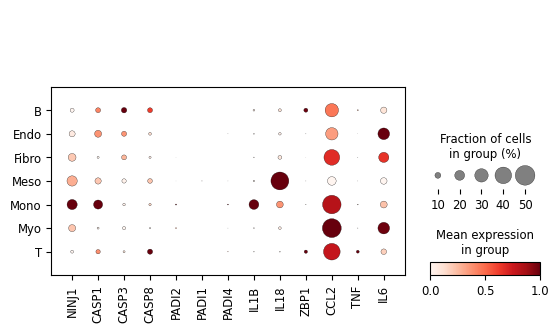

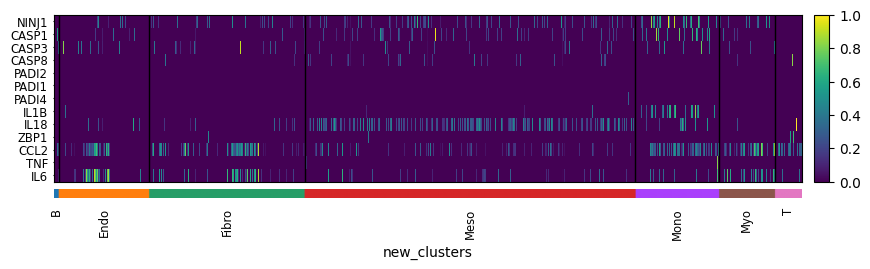

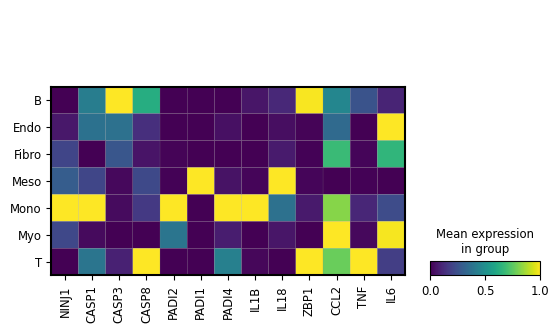

In [10]:
sc.pl.dotplot(adata_h, var_names=genes, groupby="new_clusters", standard_scale="var", use_raw=True)
sc.pl.heatmap(adata_h, var_names=genes, groupby="new_clusters", standard_scale="var", swap_axes=True)
sc.pl.matrixplot(adata_h, var_names=genes, groupby="new_clusters", standard_scale="var")

# Long PD

In [9]:
adata_l = sc.read(data_path+'/GSE130888_RAW/LPD/results_2.h5ad' )
adata_l = adata_l[~adata_l.obs["new_clusters"].str.startswith("U")]
adata_l

View of AnnData object with n_obs × n_vars = 18078 × 21841
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub', 'louvain_Meso_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'louvain', 'louvain_Meso_sub_colors', 'louvain_T_sub_colors', 'louvain_colors', 'neighbors', 'new_clusters_colors', 'pca', 'rank_genes_Meso_sub', 'rank_genes_T_sub', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

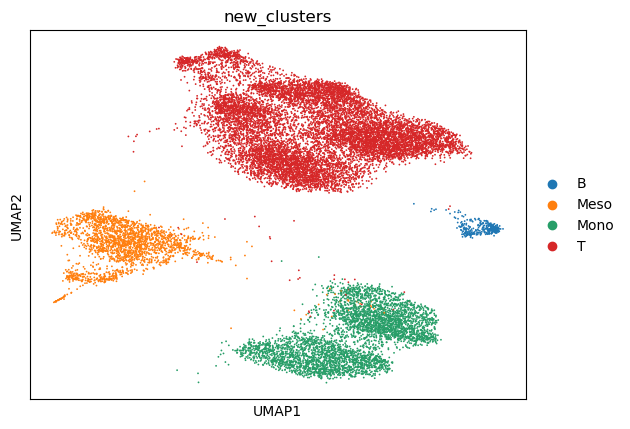

In [10]:
sc.pl.umap(adata_l, color="new_clusters", ncols=2, vmin="p1.5", vmax="p98.5")

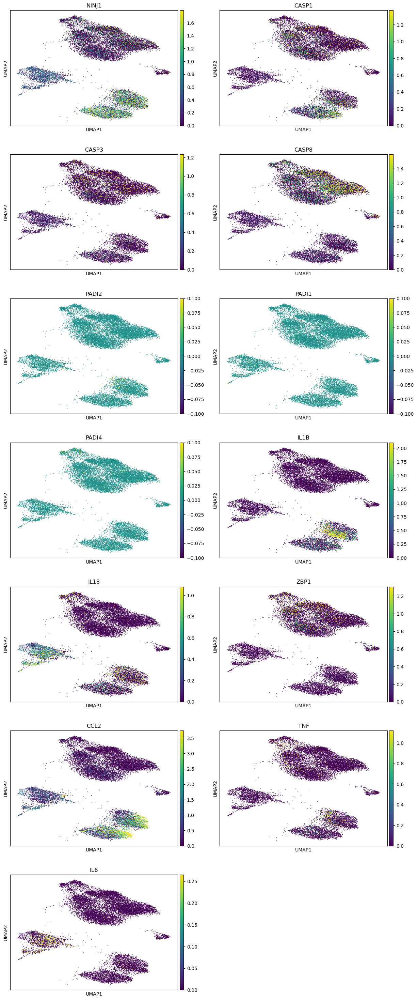

In [11]:
sc.pl.umap(adata_l, color=genes, ncols=2, vmin="p1.5", vmax="p98.5")

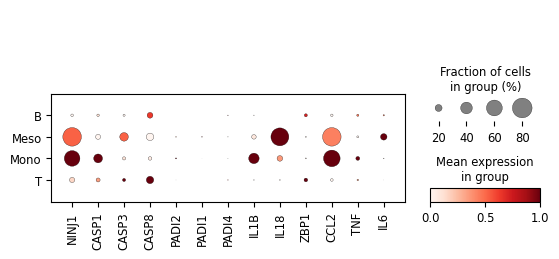

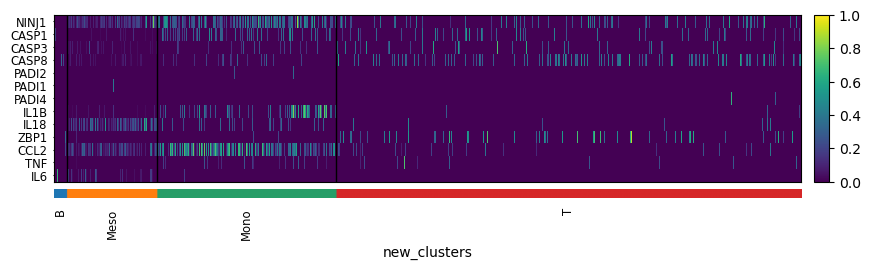

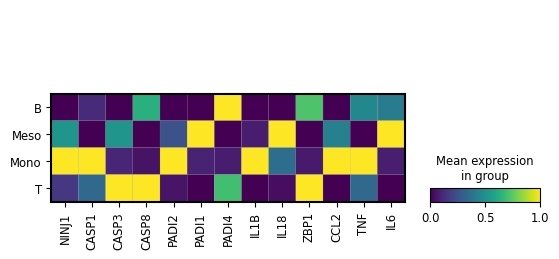

In [12]:
sc.pl.dotplot(adata_l, var_names=genes, groupby="new_clusters", standard_scale="var")
sc.pl.heatmap(adata_l, var_names=genes, groupby="new_clusters", standard_scale="var", swap_axes=True)
sc.pl.matrixplot(adata_l, var_names=genes, groupby="new_clusters", standard_scale="var")

# Short PD

In [13]:
adata_s = sc.read(data_path+'/GSE130888_RAW/SPD/results_2.h5ad' )
adata_s = adata_s[~adata_s.obs["new_clusters"].str.startswith("U")]
adata_s

View of AnnData object with n_obs × n_vars = 50999 × 22221
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub', 'louvain_Meso_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'louvain', 'louvain_Meso_sub_colors', 'louvain_T_sub_colors', 'louvain_colors', 'neighbors', 'new_clusters_colors', 'pca', 'rank_genes_Meso_sub', 'rank_genes_T_sub', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

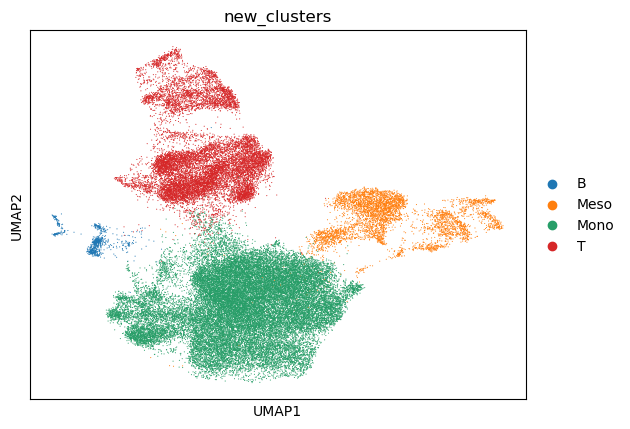

In [14]:
sc.pl.umap(adata_s, color="new_clusters", ncols=2, vmin="p1.5", vmax="p98.5")

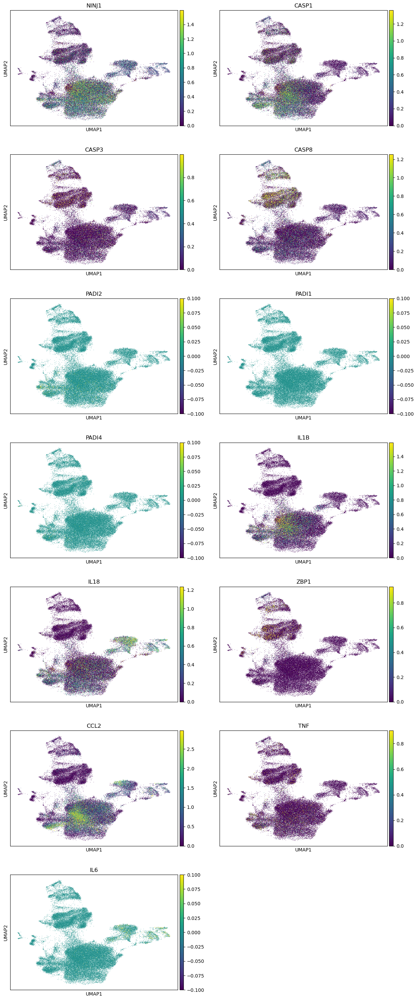

In [15]:
sc.pl.umap(adata_s, color=genes, ncols=2, vmin="p1.5", vmax="p98.5")

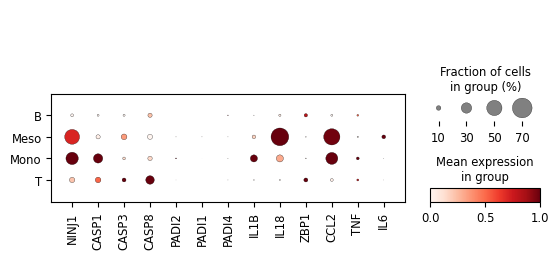

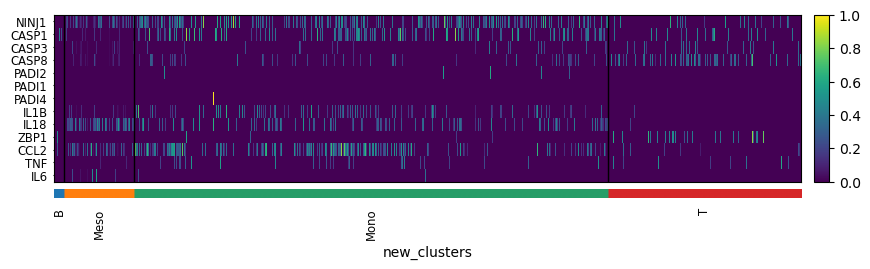

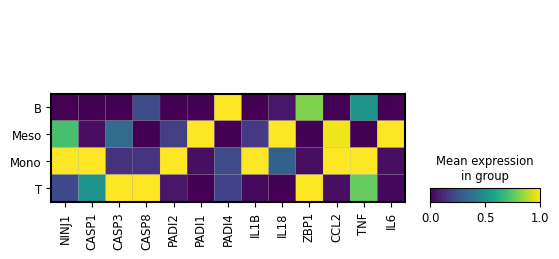

In [16]:
sc.pl.dotplot(adata_s, var_names=genes, groupby="new_clusters", standard_scale="var")
sc.pl.heatmap(adata_s, var_names=genes, groupby="new_clusters", standard_scale="var", swap_axes=True)
sc.pl.matrixplot(adata_s, var_names=genes, groupby="new_clusters", standard_scale="var")

# Integrate data

In [17]:
adata_h.obs["sample"] = "healthy"
adata_l.obs["sample"] = "longPD"
adata_s.obs["sample"] = "shortPD"

In [18]:
adata = sc.concat([adata_h, adata_l], join="outer")
adata = sc.concat([adata, adata_s], join="outer")
adata

AnnData object with n_obs × n_vars = 84834 × 23947
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub', 'louvain_Meso_sub'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [19]:
#sc.pl.umap(adata, color=["sample", "new_clusters"], ncols=1)

In [20]:
sc.pp.highly_variable_genes(
    adata, n_top_genes=2000, flavor="cell_ranger", batch_key="sample")
adata.var

,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
index,,,,,,
A1BG,False,0.125869,0.866424,0.301006,0,False
A1BG-AS1,False,0.008323,0.858497,-0.265326,0,False
A1CF,False,0.000031,0.108934,0.039393,0,False
A2M,True,0.153150,1.030320,2.003746,1,False
A2M-AS1,True,0.014456,1.181380,3.108209,3,True
...,...,...,...,...,...,...
ZYX,False,0.291412,0.780846,0.354376,0,False
ZZEF1,False,0.046209,0.927613,0.543605,0,False
ZZZ3,False,0.039464,0.898755,0.315014,0,False


In [21]:
adata_hvg = adata[:, adata.var["highly_variable"]].copy()
adata_hvg

AnnData object with n_obs × n_vars = 84834 × 2000
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub', 'louvain_Meso_sub'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

## scVI

In [22]:
import scvi

In [23]:
adata_scvi = adata_hvg.copy()
scvi.model.SCVI.setup_anndata(adata_scvi, layer="counts", batch_key="sample")
adata_scvi

AnnData object with n_obs × n_vars = 84834 × 2000
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub', 'louvain_Meso_sub', '_scvi_batch', '_scvi_labels'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [24]:
model_scvi = scvi.model.SCVI(adata_scvi)
model_scvi

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

##  scANVI

In [25]:
import numpy as np
max_epochs_scvi = np.min([round((20000 / adata.n_obs) * 400), 400])
max_epochs_scvi

np.int64(94)

In [26]:
model_scvi = scvi.model.SCVI(adata_scvi)
model_scanvi = scvi.model.SCANVI.from_scvi_model(
    model_scvi, labels_key="new_clusters", unlabeled_category="unlabelled"
)
print(model_scanvi)
model_scanvi.view_anndata_setup()

ScanVI Model with the following params: 
unlabeled_category: unlabelled, n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: zinb
Training status: Not Trained
Model's adata is minified?: False

Anndata setup with scvi-tools version 1.4.0.post1.

Setup via `SCANVI.setup_anndata` with arguments:

{
│   'labels_key': 'new_clusters',
│   'unlabeled_category': 'unlabelled',
│   'layer': 'counts',
│   'batch_key': 'sample',
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None,
│   'use_minified': False
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   3   │
│         n_cells          │ 84834 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   8   │
│          n_vars          │ 2000  │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │  adata.layers['counts']   │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │  healthy   │          0          │
│                     │   longPD   │          1          │
│                     │  shortPD   │          2          │
└─────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['new_clusters'] │     B      │          0          │
│                           │    Endo    │          1          │
│                           │   Fibro    │          2          │
│                           │    Meso    │          3          │
│                           │    Mono    │          4          │
│                           │    Myo     │          5          │
│                           │     T      │          6          │
│                           │ unlabelled │          7          │
└───────────────────────────┴────────────┴─────────────────────┘

In [27]:
max_epochs_scanvi = int(np.min([10, np.max([2, round(max_epochs_scvi / 3.0)])]))
model_scanvi.train(max_epochs=max_epochs_scanvi, accelerator="cpu")#, device=None)

INFO     Training for 10 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|          | 0/10 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


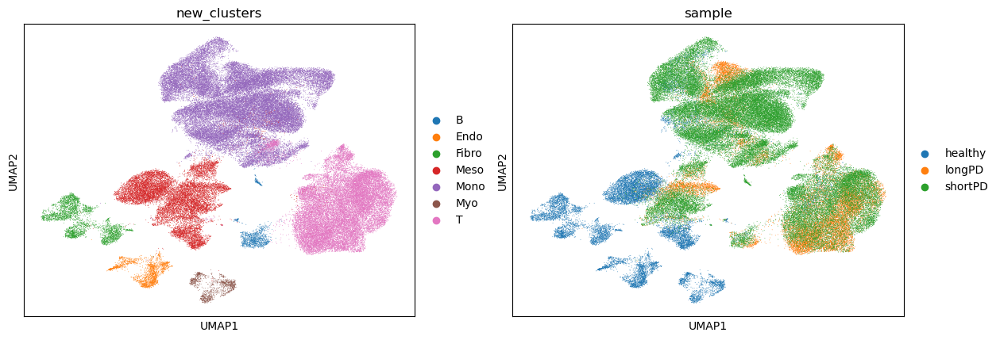

In [28]:
adata_scanvi = adata_scvi.copy()
adata_scanvi.obsm["X_scANVI"] = model_scanvi.get_latent_representation()
sc.pp.neighbors(adata_scanvi, use_rep="X_scANVI")
sc.tl.umap(adata_scanvi)
sc.pl.umap(adata_scanvi, color=["new_clusters", "sample"])#, wspace=1)

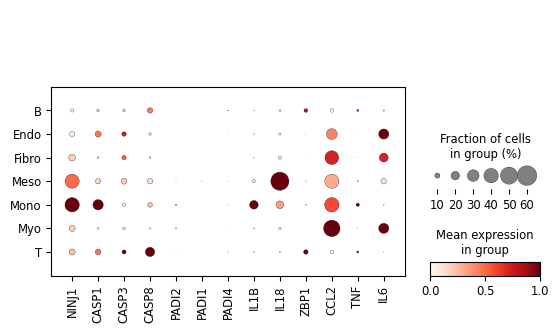

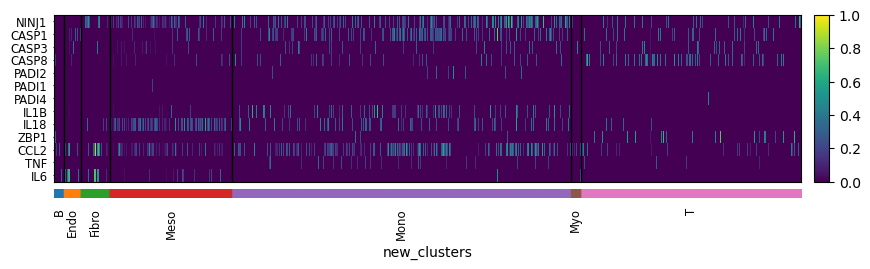

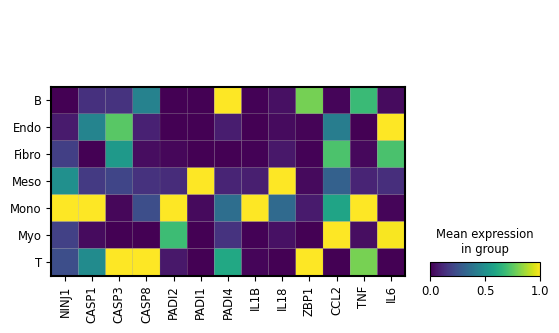

In [29]:
sc.pl.dotplot(adata_scanvi, var_names=genes, groupby="new_clusters", standard_scale="var")
sc.pl.heatmap(adata_scanvi, var_names=genes, groupby="new_clusters", standard_scale="var", swap_axes=True)
sc.pl.matrixplot(adata_scanvi, var_names=genes, groupby="new_clusters", standard_scale="var")

In [30]:
categories_order = ["Mono_healthy", "Mono_shortPD", "Mono_longPD", 
                 "T_healthy", "T_shortPD", "T_longPD", 
                 "B_healthy", "B_shortPD", "B_longPD", 
                 "Meso_healthy", "Meso_shortPD", "Meso_longPD", 
                 "Endo_healthy", "Fibro_healthy", "Myo_healthy"]

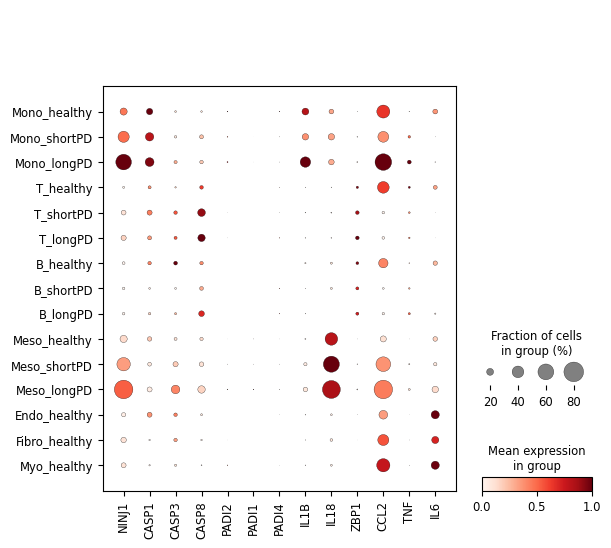

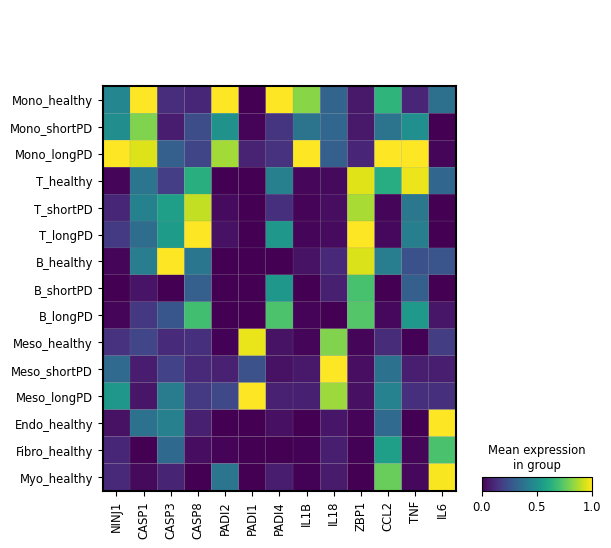

In [31]:
sc.pl.dotplot(adata_scanvi, var_names=genes, groupby=["new_clusters", "sample"], standard_scale="var", categories_order=categories_order)
#sc.pl.heatmap(adata_scanvi, var_names=genes, groupby=["new_clusters", "sample"], standard_scale="var", swap_axes=True)
sc.pl.matrixplot(adata_scanvi, var_names=genes, groupby=["new_clusters", "sample"], standard_scale="var",categories_order=categories_order)

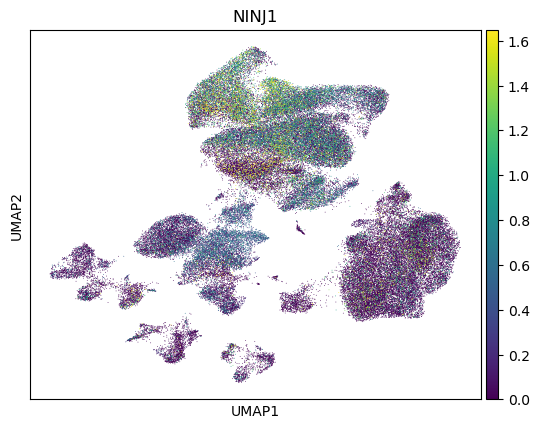

In [9]:
sc.pl.umap(adata_scanvi, color="NINJ1", use_raw=True, vmin="p1.5", vmax="p98.5", ncols=2)#, wspace=1)

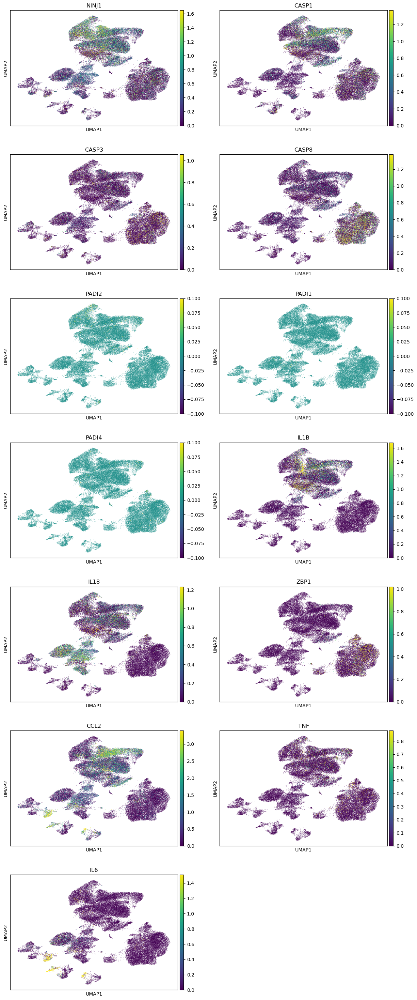

In [8]:
sc.pl.umap(adata_scanvi, color=genes, use_raw=True, vmin="p1.5", vmax="p98.5", ncols=2)#, wspace=1)

In [47]:
adata_scanvi.obs

,batch,sample,n_counts,percent_mito,n_genes,size_factors,louvain,new_clusters,louvain_T_sub,louvain_Meso_sub,_scvi_batch,_scvi_labels
index,,,,,,,,,,,,
AAACCTGCACGCCAGT-1-0-0,batch_0,healthy,5721.0,0.031288,1768,1.096684,Fibro_1,Fibro,Fibro,Fibro,0,2
AAACCTGCACTGAAGG-1-0-0,batch_0,healthy,6029.0,0.026538,1952,1.135011,Meso_2,Meso,Meso,"Meso,1",0,3
AAACCTGGTGTGGCTC-1-0-0,batch_0,healthy,7374.0,0.039870,2076,1.246110,Meso_1,Meso,Meso,"Meso,0",0,3
AAACCTGGTGTGGTTT-1-0-0,batch_0,healthy,6367.0,0.061567,1957,1.148055,Meso_1,Meso,Meso,"Meso,0",0,3
AAACCTGTCGCCTGTT-1-0-0,batch_0,healthy,4184.0,0.047801,1538,0.780805,Meso_1,Meso,Meso,"Meso,0",0,3
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTCTGCAAT-1-1,batch_5,shortPD,4699.0,0.046606,1484,1.048069,Mono_1,Mono,Mono,Mono,2,4
TTTGTCAGTTCCCTTG-1-1,batch_5,shortPD,2339.0,0.041471,1094,0.676472,Mono_1,Mono,Mono,Mono,2,4
TTTGTCATCACGCGGT-1-1,batch_5,shortPD,3558.0,0.038786,1211,0.805355,Mono_3,Mono,Mono,Mono,2,4


In [48]:
## NINJ1 expression

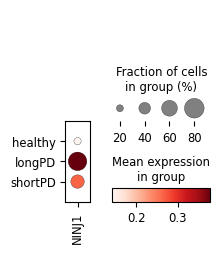

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

healthy vs. shortPD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.240e-160 U_stat=1.261e+07
shortPD vs. longPD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.371e-57 U_stat=4.021e+06
healthy vs. longPD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.005e+06


[Text(0.5, 23.52222222222222, 'Meso')]

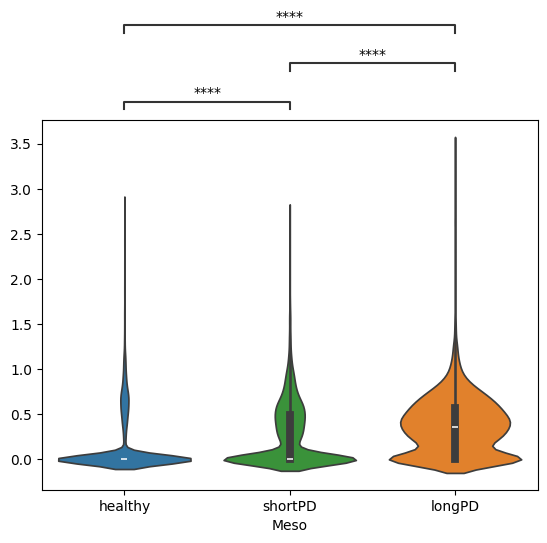

In [56]:
adata_tmp = adata_scanvi[adata_scanvi.obs.new_clusters == "Meso"]
sc.pl.dotplot(adata_tmp, var_names="NINJ1", groupby="sample")

ax=sb.violinplot(x=adata_tmp[:,gene].obs["sample"],
           y=adata_tmp.raw[:,gene].X.toarray().ravel(), #np.concatenate(adata_tmp.raw[:,gene].X.toarray() ).ravel(), #adata[:,gene].X
           hue=adata_tmp[:,gene].obs["sample"],
           order=["healthy", "shortPD","longPD"])
          # whis=[5, 95])

from statannotations.Annotator import Annotator
pairs=[("healthy", "shortPD"), ("healthy", "longPD"), ("shortPD", "longPD")]
annotator = Annotator(ax, pairs,
                    x=adata_tmp[:,gene].obs["sample"],                  
                    y=adata_tmp.raw[:,gene].X.toarray().ravel(),
                    order=["healthy", "shortPD","longPD"],)
annotator.configure(test='Mann-Whitney', text_format='star', loc='outside')
annotator.apply_and_annotate()
ax.set(xlabel='Meso')

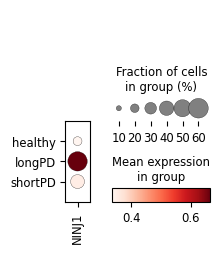

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

healthy vs. shortPD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.985e-22 U_stat=2.508e+07
shortPD vs. longPD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.220e-242 U_stat=5.070e+07
healthy vs. longPD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.460e-99 U_stat=2.587e+06


[Text(0.5, 23.52222222222222, 'Mono')]

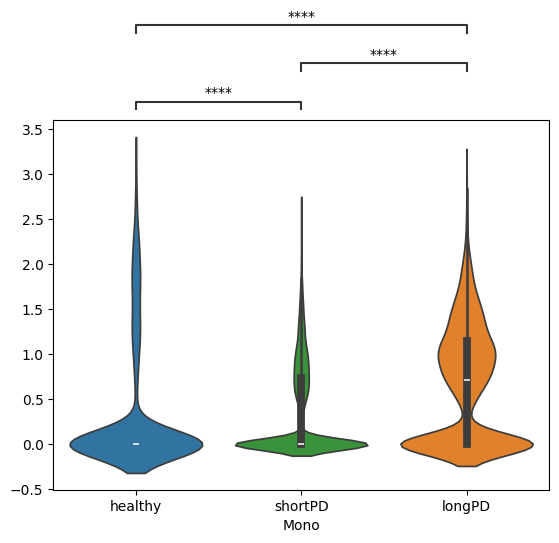

In [57]:
adata_tmp = adata_scanvi[adata_scanvi.obs.new_clusters == "Mono"]
sc.pl.dotplot(adata_tmp, var_names="NINJ1", groupby="sample")

ax=sb.violinplot(x=adata_tmp[:,gene].obs["sample"],
           y=adata_tmp.raw[:,gene].X.toarray().ravel(), #np.concatenate(adata_tmp.raw[:,gene].X.toarray() ).ravel(), #adata[:,gene].X
           hue=adata_tmp[:,gene].obs["sample"],
           order=["healthy", "shortPD","longPD"])
          # whis=[5, 95])

from statannotations.Annotator import Annotator
pairs=[("healthy", "shortPD"), ("healthy", "longPD"), ("shortPD", "longPD")]
annotator = Annotator(ax, pairs,
                    x=adata_tmp[:,gene].obs["sample"],                  
                    y=adata_tmp.raw[:,gene].X.toarray().ravel(),
                    order=["healthy", "shortPD","longPD"],)
annotator.configure(test='Mann-Whitney', text_format='star', loc='outside')
annotator.apply_and_annotate()
ax.set(xlabel='Mono')

# Save

In [11]:
#adata_scanvi = sc.read("scanvi_data_20251210.h5ad")

In [32]:
adata_scanvi.write("scanvi_data_20251210.h5ad")

In [3]:
%%bash
#jupyter nbconvert --to  html --template pj NINJ1.ipynb --ExtractOutputPreprocessor.enabled=False
#mv NINJ1.html ./NINJ1_$(date +%Y%m%d).html 